In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
data1=pd.read_csv('Loan approval prediction.csv')

In [3]:
data1.shape

(58645, 13)

In [4]:
data1.head()

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


In [5]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          58645 non-null  int64  
 1   person_age                  58645 non-null  int64  
 2   person_income               58645 non-null  int64  
 3   person_home_ownership       58645 non-null  object 
 4   person_emp_length           58645 non-null  float64
 5   loan_intent                 58645 non-null  object 
 6   loan_grade                  58645 non-null  object 
 7   loan_amnt                   58645 non-null  int64  
 8   loan_int_rate               58645 non-null  float64
 9   loan_percent_income         58645 non-null  float64
 10  cb_person_default_on_file   58645 non-null  object 
 11  cb_person_cred_hist_length  58645 non-null  int64  
 12  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(6), object

In [6]:
data1.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,58645.000000,58645.000000,5.864500e+04,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000,58645.000000
mean,29322.000000,27.550857,6.404617e+04,4.701015,9217.556518,10.677874,0.159238,5.813556,0.142382
std,16929.497605,6.033216,3.793111e+04,3.959784,5563.807384,3.034697,0.091692,4.029196,0.349445
min,0.000000,20.000000,4.200000e+03,0.000000,500.000000,5.420000,0.000000,2.000000,0.000000
25%,14661.000000,23.000000,4.200000e+04,2.000000,5000.000000,7.880000,0.090000,3.000000,0.000000
50%,29322.000000,26.000000,5.800000e+04,4.000000,8000.000000,10.750000,0.140000,4.000000,0.000000
75%,43983.000000,30.000000,7.560000e+04,7.000000,12000.000000,12.990000,0.210000,8.000000,0.000000
max,58644.000000,123.000000,1.900000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000,1.000000


### Looking for null values

In [7]:
data1.isnull().sum()

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

In [8]:
data1['person_home_ownership'].value_counts()

person_home_ownership
RENT        30594
MORTGAGE    24824
OWN          3138
OTHER          89
Name: count, dtype: int64

In [9]:
#remove the rows with 'OTHER' person_home_ownership
data1=data1[data1['person_home_ownership']!='OTHER']

In [10]:
data1['person_home_ownership'].value_counts()

person_home_ownership
RENT        30594
MORTGAGE    24824
OWN          3138
Name: count, dtype: int64

In [11]:
data1['loan_intent'].value_counts()

loan_intent
EDUCATION            12254
MEDICAL              10927
PERSONAL              9993
VENTURE               9989
DEBTCONSOLIDATION     9123
HOMEIMPROVEMENT       6270
Name: count, dtype: int64

In [12]:
#Skewness
data1['loan_status'].value_counts()

loan_status
0    50221
1     8335
Name: count, dtype: int64

### What can we conclude?
- Here, we can see that majority of the income falls under a small range between $30,000 and about $100,000 a year.

- Individuals with older ages (above 60) show greater variance in income for both loan statuses.

- Another weird thing that the graph indicates is that the people who didn't get a loan approval tend to have higher incomes across most age groups.

- At extremely high ages (above 80), there are unusual data points where income spikes for both categories, but these are likely outliers or rare cases in the data.

### Data Visualization

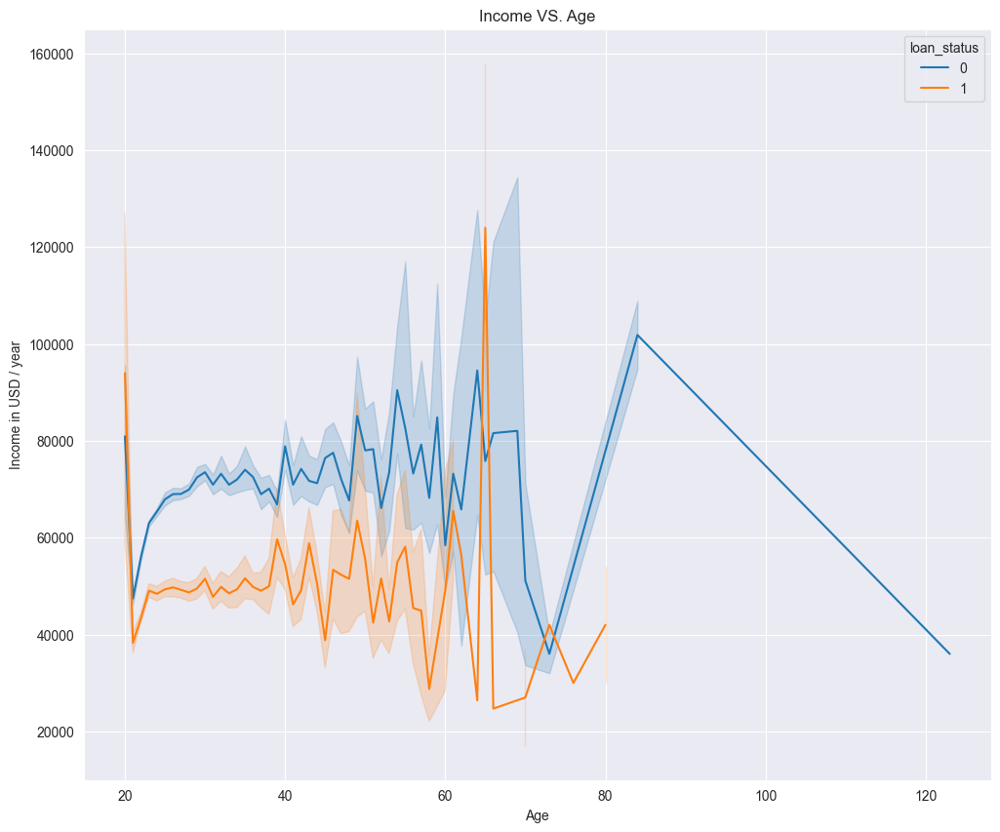

In [13]:
plt.figure(figsize=(12,10))
sns.set_style("darkgrid")

ax = sns.lineplot(x = "person_age", 
                    y = "person_income", 
                    data = data1, 
                    hue = "loan_status"
                    )

plt.title("Income VS. Age")
plt.xlabel("Age")
plt.ylabel("Income in USD / year")
plt.show()

### The intenstion of this bar chart was to identify what was the leading cause for applying for loans. What was found:
- There is <u>**no**</u> major leading cause for the loan applications.

- The lowest accepted categories by far were "Venture" & "Home Improvement".

- The lowest category in terms of total loan applications is "Home Improvement".

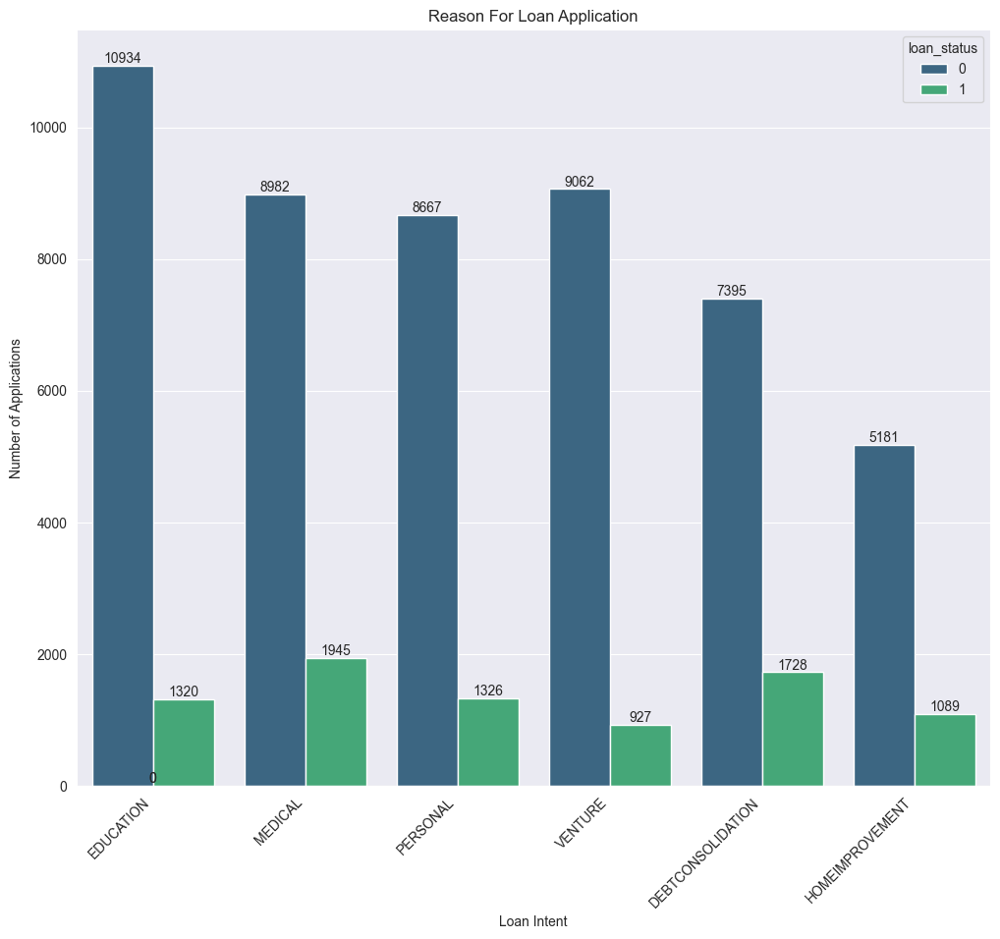

In [14]:
plt.figure(figsize=(12, 10))
sns.set_style("darkgrid")

ax = sns.countplot(x="loan_intent", data=data1, hue="loan_status", palette="viridis")

for p in ax.patches:
    height = p.get_height()  
    ax.text(
        p.get_x() + p.get_width() / 2,  
        height + 0.1,  
        str(int(height)),  
        ha='center',  
        va='bottom'  
    )

ax.set_xlabel("Loan Intent")
ax.set_ylabel("Number of Applications")
ax.set_xticks(range(len(data1['loan_intent'].unique())))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title("Reason For Loan Application")

plt.show()


### A lot of Effective pieces of information could be gained:
- Only a small portion of the applicants are actual <u>**Owners**</u> of a house, which could indicate that the applicants that have a "Mortage" haven't still payed it fully.

- The "Other" category are so low in amount and could be neglected and removed from the dataset to avoid any problems during modelling.

- Home owners don't usually tend to apply for loans.

- Over 81% of the total approved loans were for the applicants that <u>**Rent**</u> and about 18% of total approved loans were for applicants that own a <u>**Mortage**</u>.

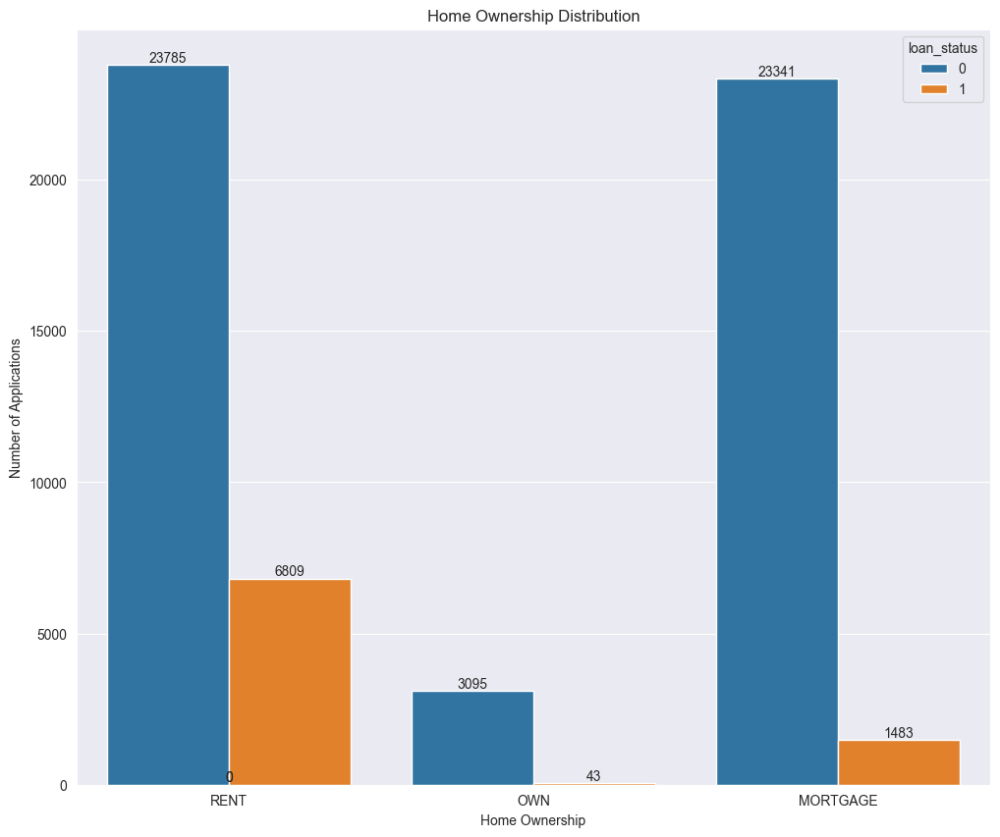

In [15]:
plt.figure(figsize=(12, 10))
sns.set_style("darkgrid")

ax = sns.countplot(x="person_home_ownership", data=data1, hue="loan_status")

for p in ax.patches:
    height = p.get_height()  
    ax.text(
        p.get_x() + p.get_width() / 2,  
        height + 0.1,  
        str(int(height)),  
        ha='center',  
        va='bottom'  
    )

ax.set_xlabel("Home Ownership")
ax.set_ylabel("Number of Applications")
ax.set_xticks(range(len(data1['person_home_ownership'].unique())))
plt.title("Home Ownership Distribution")

plt.show()

### This plot shows the relation between the home ownership and the loan approval

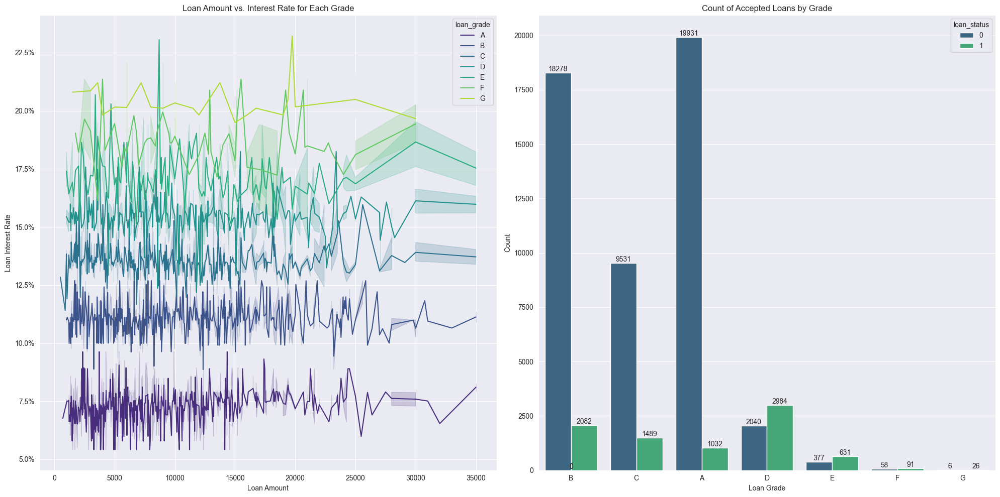

In [16]:
import matplotlib.ticker as mticker
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

sns.set_style("darkgrid")

# First plot: Lineplot showing loan amount vs. interest rate for each grade
loan_grade_order = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
sns.lineplot(x="loan_amnt", y="loan_int_rate", data=data1, hue="loan_grade", 
             palette="viridis", hue_order=loan_grade_order, ax=axes[0])

axes[0].set_title("Loan Amount vs. Interest Rate for Each Grade")
axes[0].set_xlabel("Loan Amount")
axes[0].set_ylabel("Loan Interest Rate")

axes[0].yaxis.set_major_formatter(mticker.PercentFormatter(100.0))

# Second plot: Countplot showing the count of accepted loans for each grade
sns.countplot(x="loan_grade", data=data1, hue="loan_status", palette="viridis", ax=axes[1])

# Add count labels on top of the bars
for p in axes[1].patches:
    height = p.get_height()  
    axes[1].text(
        p.get_x() + p.get_width() / 2,  
        height + 0.1,  
        str(int(height)),  
        ha='center',  
        va='bottom' 
    )

axes[1].set_title("Count of Accepted Loans by Grade")
axes[1].set_xlabel("Loan Grade")
axes[1].set_ylabel("Count")

plt.tight_layout()

plt.show()

### What does this distributed graph shows?
- Each Grade has its own range of loan interest rate:
    - <u>Grade A</u> : ***5% - 10%***
    - <u>Grade B</u> : ***10% - 12.5%***
    - <u>Grade C</u> : ***12.5% - 15.5%***
    - <u>Grade D</u> : ***13% - 17.5%***
    - <u>Grade E</u> : ***14% - 20%***
    - <u>Grade F</u> : ***15% - 21%***
    - <u>Grade G</u> : ***Above 20%***
- Almost no Grade E, F and G have approved loans
- Grades B and D have the most approved loans
- Grade A loans has the highest number of rejected loans.

- About ratio between count and approval:
    - Grade D has the best [reject : approve] ratio about **2:3**
    - Grade A has the worst [reject : approve] ratio about **20:1**

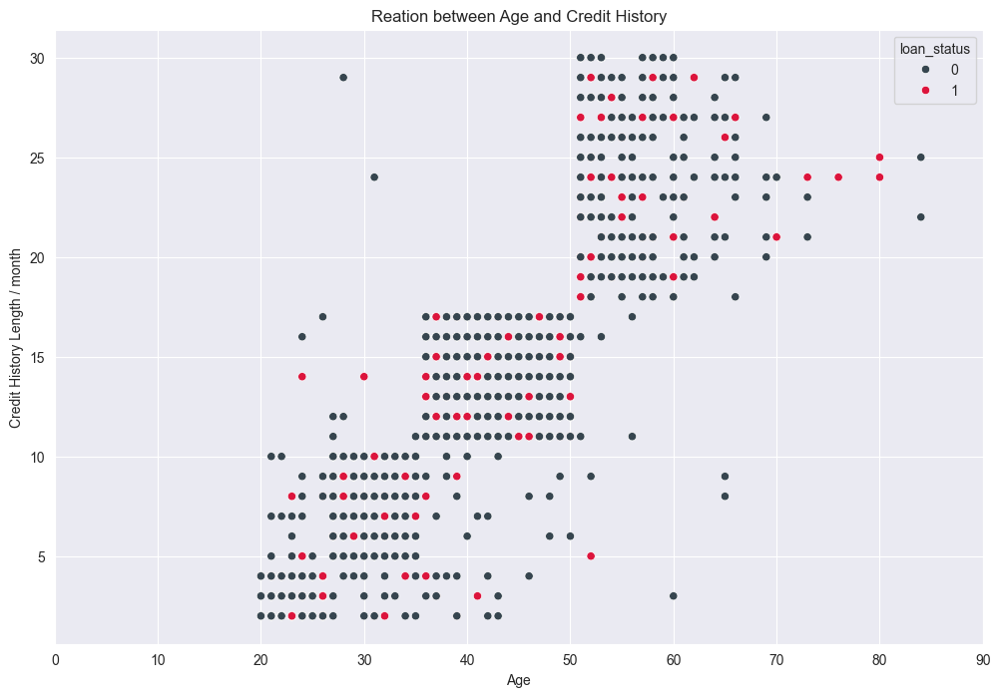

In [17]:
plt.figure(figsize=(12,8))
sns.set_style("darkgrid")

sns.scatterplot(x = "person_age", y = "cb_person_cred_hist_length", data = data1, hue = "loan_status", palette={0:"#36454F", 1:"crimson"})

plt.xlim(0, 90)
plt.title("Reation between Age and Credit History")
plt.xlabel("Age")
plt.ylabel("Credit History Length / month")

plt.show()

### While there are numerous outliers, the scatter plot shows a clear trend:
- Citizens with greater age have more credit history length due to the longer duration that they have lived.

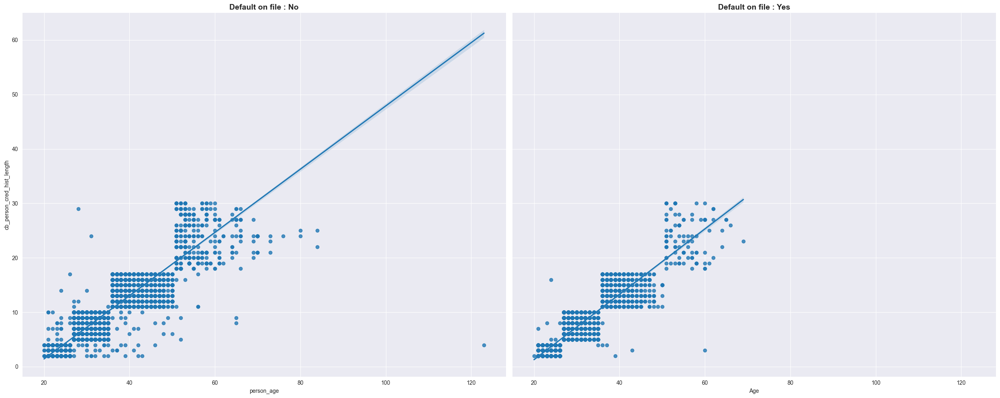

In [18]:
ax = sns.lmplot(x = "person_age", y = "cb_person_cred_hist_length", data = data1, col = "cb_person_default_on_file", col_wrap = 2, height=10, aspect=1.25)

# Set custom titles manually for each subplot
titles = ["Default on file : No", "Default on file : Yes"]  
for axis, title in zip(ax.axes.flat, titles):
    axis.set_title(title, fontsize=14, fontweight='bold')

plt.xlabel("Age")
plt.ylabel("Credit History Length / month")

plt.show()

### The reationship is furthermore shown in a more clear manner in this plot.


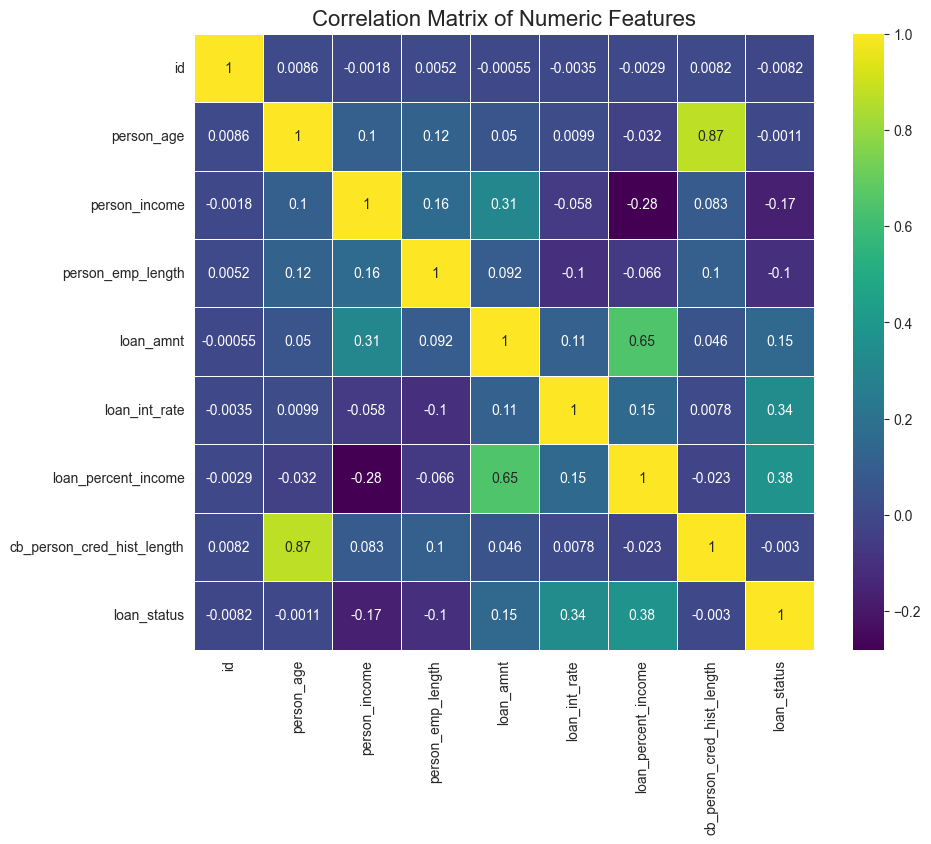

In [20]:
numeric = data1.select_dtypes(include=['number'])
correlation_matrix = numeric.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', linewidths=0.5) 
plt.title('Correlation Matrix of Numeric Features', fontsize=16)
plt.show()

### This matrix gives the correlation coefficients between variables

### Looking for outliers

In [ ]:
for column in data1.select_dtypes(include=['number']).columns:
	fig = px.box(data1, x=column, title= f'Box plot for {column}')
	fig.show()

In [ ]:
#make two copies of the data with two different approaches and see which will get a better result
data2=data1.copy()
data2= data2[data2['person_age'] <= 40]
data2= data2[data2['person_income'] <= 126000]
data2= data2[data2['person_emp_length'] <= 14]
data2= data2[data2['loan_amnt'] <= 22500]
data2= data2[data2['loan_int_rate'] <= 20.62]
data2= data2[data2['loan_percent_income'] <= 0.39]
data2= data2[data2['cb_person_cred_hist_length'] <= 15]

In [ ]:
for column in data2.select_dtypes(include=['number']).columns:
	fig = px.box(data2, x=column, title= f'Box plot for {column}')
	fig.show()

In [ ]:
data2['loan_status'].value_counts()

loan_status
0    43404
1     6402
Name: count, dtype: int64

In [ ]:
data2.shape

(49806, 13)

In [ ]:
data1.shape

(58556, 13)

In [ ]:
data3=data2.copy()
data3 = data3[data3['loan_status'] == 0]
data3 = data3.sample(n=6402, random_state=42)

In [ ]:
data3.shape

(6402, 13)

In [ ]:
data3 = pd.concat([data3, data2[data2['loan_status'] == 1]], axis=0, ignore_index=True)

In [ ]:
data3.shape

(12804, 13)

- Data 1 is the whole data
- Data 2 is the data without outliers
- Data 3 is the balanced data (the two categories have the same number of rows)

### Encoding

In [ ]:
data1= pd.concat([data1, pd.get_dummies(data1['person_home_ownership'], prefix='person_home_ownership')], axis=1)
data1= pd.concat([data1, pd.get_dummies(data1['loan_intent'], prefix='loan_intent')], axis=1)
data1['cb_person_default_on_file'] = data1['cb_person_default_on_file'].replace({'N': 0, 'Y': 1})

C:\Users\tarok\AppData\Local\Temp\ipykernel_12332\884082549.py:3: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data1['loan_grade'] = label_encoder.fit_transform(data1['loan_grade'])

In [ ]:
data2= pd.concat([data2, pd.get_dummies(data2['person_home_ownership'], prefix='person_home_ownership')], axis=1)
data2= pd.concat([data2, pd.get_dummies(data2['loan_intent'], prefix='loan_intent')], axis=1)
data2['cb_person_default_on_file'] = data2['cb_person_default_on_file'].replace({'N': 0, 'Y': 1})

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data2['loan_grade'] = label_encoder.fit_transform(data2['loan_grade'])

C:\Users\tarok\AppData\Local\Temp\ipykernel_12332\3590291470.py:3: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
data3= pd.concat([data3, pd.get_dummies(data3['person_home_ownership'], prefix='person_home_ownership')], axis=1)
data3= pd.concat([data3, pd.get_dummies(data3['loan_intent'], prefix='loan_intent')], axis=1)
data3['cb_person_default_on_file'] = data3['cb_person_default_on_file'].replace({'N': 0, 'Y': 1})

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data3['loan_grade'] = label_encoder.fit_transform(data3['loan_grade'])

C:\Users\tarok\AppData\Local\Temp\ipykernel_12332\4144979427.py:3: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [ ]:
data1.columns

Index(['id', 'person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'loan_status',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE'],
      dtype='object')

### Split the data

In [ ]:
columns1=[ 'person_age', 'person_income',
       'person_emp_length', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']

X1=data1[columns1]
y1=data1['loan_status']

X1.shape

(58556, 18)

In [ ]:
from sklearn.model_selection import train_test_split
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size = 0.25, random_state = 101)

X1_train.shape

(43917, 18)

### Scaling

In [ ]:
X1_train_Numeric =X1_train [['person_age', 'person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']]
X1_test_Numeric =X1_test [['person_age', 'person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']]

from sklearn.preprocessing import Normalizer

scaler_normalizer = Normalizer()
X1Normalized_train_NotEncoded = scaler_normalizer.fit_transform(X1_train_Numeric)
X1Normalized_train_NotEncoded = pd.DataFrame(X1Normalized_train_NotEncoded, columns=X1_train_Numeric.columns)

X1Normalized_test_NotEncoded = scaler_normalizer.fit_transform(X1_test_Numeric)
X1Normalized_test_NotEncoded = pd.DataFrame(X1Normalized_test_NotEncoded, columns=X1_test_Numeric.columns)

X1_train.reset_index(drop=True, inplace=True)
X1Normalized_train_NotEncoded.reset_index(drop=True, inplace=True)

data1Normalized_train = pd.concat([X1Normalized_train_NotEncoded, X1_train[['loan_grade','cb_person_default_on_file',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']]], axis=1)

X1_test.reset_index(drop=True, inplace=True)
X1Normalized_test_NotEncoded.reset_index(drop=True, inplace=True)

data1Normalized_test = pd.concat([X1Normalized_test_NotEncoded, X1_test[['loan_grade','cb_person_default_on_file',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']]], axis=1)
data1Normalized_train.shape

(43917, 18)

In [ ]:
data1Normalized_test.shape

(14639, 18)

In [ ]:
columns2=[ 'person_age', 'person_income',
       'person_emp_length', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']

X2=data2[columns2]
y2=data2['loan_status']

from sklearn.model_selection import train_test_split
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size = 0.25, random_state = 101)

X2_train_Numeric =X2_train [['person_age', 'person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']]
X2_test_Numeric =X2_test [['person_age', 'person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']]

from sklearn.preprocessing import Normalizer

scaler_normalizer = Normalizer()
X2Normalized_train_NotEncoded = scaler_normalizer.fit_transform(X2_train_Numeric)
X2Normalized_train_NotEncoded = pd.DataFrame(X2Normalized_train_NotEncoded, columns=X2_train_Numeric.columns)

X2Normalized_test_NotEncoded = scaler_normalizer.fit_transform(X2_test_Numeric)
X2Normalized_test_NotEncoded = pd.DataFrame(X2Normalized_test_NotEncoded, columns=X2_test_Numeric.columns)

X2_train.reset_index(drop=True, inplace=True)
X2Normalized_train_NotEncoded.reset_index(drop=True, inplace=True)

data2Normalized_train = pd.concat([X2Normalized_train_NotEncoded, X2_train[['loan_grade','cb_person_default_on_file',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']]], axis=1)

X2_test.reset_index(drop=True, inplace=True)
X2Normalized_test_NotEncoded.reset_index(drop=True, inplace=True)

data2Normalized_test = pd.concat([X2Normalized_test_NotEncoded, X2_test[['loan_grade','cb_person_default_on_file',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']]], axis=1)

In [ ]:
columns3=[ 'person_age', 'person_income',
       'person_emp_length', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']

X3=data3[columns3]
y3=data3['loan_status']

from sklearn.model_selection import train_test_split
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size = 0.25, random_state = 101)

X3_train_Numeric =X3_train [['person_age', 'person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']]
X3_test_Numeric =X3_test [['person_age', 'person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']]

from sklearn.preprocessing import Normalizer

scaler_normalizer = Normalizer()
X3Normalized_train_NotEncoded = scaler_normalizer.fit_transform(X3_train_Numeric)
X3Normalized_train_NotEncoded = pd.DataFrame(X3Normalized_train_NotEncoded, columns=X3_train_Numeric.columns)

X3Normalized_test_NotEncoded = scaler_normalizer.fit_transform(X3_test_Numeric)
X3Normalized_test_NotEncoded = pd.DataFrame(X3Normalized_test_NotEncoded, columns=X3_test_Numeric.columns)

X3_train.reset_index(drop=True, inplace=True)
X3Normalized_train_NotEncoded.reset_index(drop=True, inplace=True)

data3Normalized_train = pd.concat([X3Normalized_train_NotEncoded, X3_train[['loan_grade','cb_person_default_on_file',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']]], axis=1)

X3_test.reset_index(drop=True, inplace=True)
X3Normalized_test_NotEncoded.reset_index(drop=True, inplace=True)

data3Normalized_test = pd.concat([X3Normalized_test_NotEncoded, X3_test[['loan_grade','cb_person_default_on_file',
       'person_home_ownership_MORTGAGE', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_DEBTCONSOLIDATION',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE']]], axis=1)

### Manual ML

In [ ]:
from sklearn.base import BaseEstimator
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline  # Import Pipeline
from sklearn.model_selection import GridSearchCV  # Import GridSearchCV
import numpy as np

# Define the ClfSwitcher class
class ClfSwitcher(BaseEstimator):
    def __init__(self, estimator=None):
        self.estimator = estimator

    def fit(self, X, y):
        self.estimator.fit(X, y)
        return self

    def predict(self, X):
        return self.estimator.predict(X)

    def predict_proba(self, X):
        if hasattr(self.estimator, 'predict_proba'):
            return self.estimator.predict_proba(X)
        else:
            raise AttributeError(f"The estimator {self.estimator} does not support predict_proba.")

# Create a pipeline
steps = [('clf', ClfSwitcher())]
pipeline = Pipeline(steps)

# Define the parameter grid with the added Logistic Regression and XGBoost models
parameters = [
    {
        'clf__estimator': [LogisticRegression()],
        'clf__estimator__penalty': ['l2'],  # Regularization
        'clf__estimator__C': np.logspace(-4, 4, 10),  # Regularization strength
        'clf__estimator__solver': ['liblinear'],  # Solver for small datasets
    },
    {
        'clf__estimator': [DecisionTreeClassifier(max_depth=5)],
        'clf__estimator__max_depth': np.arange(5, 16),
    },
    {
        'clf__estimator': [KNeighborsClassifier()],
        'clf__estimator__n_neighbors': np.arange(5, 16, 2),
    },
    {
        'clf__estimator': [RandomForestClassifier()],
        'clf__estimator__max_depth': np.arange(5, 21),
        'clf__estimator__n_estimators': np.arange(5, 21),
    },
    {
        'clf__estimator': [XGBClassifier()],
        'clf__estimator__max_depth': np.arange(3, 15, 2),
        'clf__estimator__n_estimators': np.arange(50, 201, 50),
        'clf__estimator__learning_rate': [0.01, 0.1, 0.3],
        'clf__estimator__subsample': [0.7, 0.8, 0.9, 1.0],
    }
]

# Instantiate GridSearchCV
gscv = GridSearchCV(pipeline, cv=5, param_grid=parameters, scoring="recall")

# Training the model
print('Training model...')
gscv.fit(data1Normalized_train, y1_train)

# Output the best model
print('Best model: \n\n', gscv.best_estimator_)


Training model...


c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast



Best model: 

 Pipeline(steps=[('clf',
                 ClfSwitcher(estimator=XGBClassifier(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     device=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     gamma=None,
                                                     grow_policy=None,
                    

In [ ]:
# Initialize the XGBClassifier with the specified parameters
xgb_classifier = XGBClassifier(
    learning_rate=0.3,
    max_depth=7,
    n_estimators=200,
    random_state=42,
    use_label_encoder=False,  # Avoid warning with label encoding
    eval_metric='mlogloss'    # Specify the evaluation metric (use appropriate metric)
)


# Wrap the classifier in ClfSwitcher
classifier1 = ClfSwitcher(estimator=xgb_classifier)

classifier1.fit(data1Normalized_train, y1_train)

c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[19:54:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




ClfSwitcher(estimator=XGBClassifier(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False,
                                    eval_metric='mlogloss', feature_types=None,
                                    gamma=None, grow_policy=None,
                                    importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=0.3, max_bin=None,
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=7, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=200,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...))

In [ ]:
y1_pred = classifier1.predict(data1Normalized_test)


In [ ]:
from sklearn.metrics import classification_report


print("\nClassification Report on Test Set:")
print(classification_report(y1_test, y1_pred))


Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97     12541
           1       0.90      0.70      0.79      2098

    accuracy                           0.95     14639
   macro avg       0.93      0.84      0.88     14639
weighted avg       0.94      0.95      0.94     14639



In [ ]:
from sklearn.base import BaseEstimator
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline  # Import Pipeline
from sklearn.model_selection import GridSearchCV  # Import GridSearchCV
import numpy as np

# Define the ClfSwitcher class
class ClfSwitcher(BaseEstimator):
    def __init__(self, estimator=None):
        self.estimator = estimator

    def fit(self, X, y):
        self.estimator.fit(X, y)
        return self

    def predict(self, X):
        return self.estimator.predict(X)

    def predict_proba(self, X):
        if hasattr(self.estimator, 'predict_proba'):
            return self.estimator.predict_proba(X)
        else:
            raise AttributeError(f"The estimator {self.estimator} does not support predict_proba.")

# Create a pipeline
steps = [('clf', ClfSwitcher())]
pipeline = Pipeline(steps)

# Define the parameter grid with the added Logistic Regression and XGBoost models
parameters = [
    {
        'clf__estimator': [LogisticRegression()],
        'clf__estimator__penalty': ['l2'],  # Regularization
        'clf__estimator__C': np.logspace(-4, 4, 10),  # Regularization strength
        'clf__estimator__solver': ['liblinear'],  # Solver for small datasets
    },
    {
        'clf__estimator': [DecisionTreeClassifier(max_depth=5)],
        'clf__estimator__max_depth': np.arange(5, 16),
    },
    {
        'clf__estimator': [KNeighborsClassifier()],
        'clf__estimator__n_neighbors': np.arange(5, 16, 2),
    },
    {
        'clf__estimator': [RandomForestClassifier()],
        'clf__estimator__max_depth': np.arange(5, 21),
        'clf__estimator__n_estimators': np.arange(5, 21),
    },
    {
        'clf__estimator': [XGBClassifier()],
        'clf__estimator__max_depth': np.arange(3, 15, 2),
        'clf__estimator__n_estimators': np.arange(50, 201, 50),
        'clf__estimator__learning_rate': [0.01, 0.1, 0.3],
        'clf__estimator__subsample': [0.7, 0.8, 0.9, 1.0],
    }
]

# Instantiate GridSearchCV
gscv = GridSearchCV(pipeline, cv=5, param_grid=parameters, scoring="recall")

# Training the model
print('Training model...')
gscv.fit(data2Normalized_train, y2_train)

# Output the best model
print('Best model: \n\n', gscv.best_estimator_)




Training model...


c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast



Best model: 

 Pipeline(steps=[('clf',
                 ClfSwitcher(estimator=XGBClassifier(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     device=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     gamma=None,
                                                     grow_policy=None,
                    

c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[20:11:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.





Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97     10831
           1       0.88      0.67      0.76      1621

    accuracy                           0.95     12452
   macro avg       0.92      0.83      0.87     12452
weighted avg       0.94      0.95      0.94     12452



In [ ]:

# Initialize the XGBClassifier with the specified parameters
xgb_classifier = XGBClassifier(
    learning_rate=0.3,
    max_depth=7,
    n_estimators=200,
    random_state=42,
    use_label_encoder=False,  # Avoid warning with label encoding
    eval_metric='mlogloss'    # Specify the evaluation metric (use appropriate metric)
)

# Wrap the classifier in ClfSwitcher
classifier2 = ClfSwitcher(estimator=xgb_classifier)

classifier2.fit(data2Normalized_train, y2_train)

y2_pred = classifier2.predict(data2Normalized_test)


from sklearn.metrics import classification_report


print("\nClassification Report on Test Set:")
print(classification_report(y2_test, y2_pred))

c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[20:13:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.





Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97     10831
           1       0.88      0.67      0.76      1621

    accuracy                           0.95     12452
   macro avg       0.92      0.83      0.87     12452
weighted avg       0.94      0.95      0.94     12452



In [ ]:
from sklearn.base import BaseEstimator
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline  # Import Pipeline
from sklearn.model_selection import GridSearchCV  # Import GridSearchCV
import numpy as np

# Define the ClfSwitcher class
class ClfSwitcher(BaseEstimator):
    def __init__(self, estimator=None):
        self.estimator = estimator

    def fit(self, X, y):
        self.estimator.fit(X, y)
        return self

    def predict(self, X):
        return self.estimator.predict(X)

    def predict_proba(self, X):
        if hasattr(self.estimator, 'predict_proba'):
            return self.estimator.predict_proba(X)
        else:
            raise AttributeError(f"The estimator {self.estimator} does not support predict_proba.")

# Create a pipeline
steps = [('clf', ClfSwitcher())]
pipeline = Pipeline(steps)

# Define the parameter grid with the added Logistic Regression and XGBoost models
parameters = [
    {
        'clf__estimator': [LogisticRegression()],
        'clf__estimator__penalty': ['l2'],  # Regularization
        'clf__estimator__C': np.logspace(-4, 4, 10),  # Regularization strength
        'clf__estimator__solver': ['liblinear'],  # Solver for small datasets
    },
    {
        'clf__estimator': [DecisionTreeClassifier(max_depth=5)],
        'clf__estimator__max_depth': np.arange(5, 16),
    },
    {
        'clf__estimator': [KNeighborsClassifier()],
        'clf__estimator__n_neighbors': np.arange(5, 16, 2),
    },
    {
        'clf__estimator': [RandomForestClassifier()],
        'clf__estimator__max_depth': np.arange(5, 21),
        'clf__estimator__n_estimators': np.arange(5, 21),
    },
    {
        'clf__estimator': [XGBClassifier()],
        'clf__estimator__max_depth': np.arange(3, 15, 2),
        'clf__estimator__n_estimators': np.arange(50, 201, 50),
        'clf__estimator__learning_rate': [0.01, 0.1, 0.3],
        'clf__estimator__subsample': [0.7, 0.8, 0.9, 1.0],
    }
]

# Instantiate GridSearchCV
gscv = GridSearchCV(pipeline, cv=5, param_grid=parameters, scoring="recall")

# Training the model
print('Training model...')
gscv.fit(data3Normalized_train, y3_train)

# Output the best model
print('Best model: \n\n', gscv.best_estimator_)



Training model...
Best model: 

 Pipeline(steps=[('clf',
                 ClfSwitcher(estimator=LogisticRegression(C=0.0001,
                                                          solver='liblinear')))])


c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast



In [ ]:
# Initialize the LogisticRegression with the specified parameters
logistic_regression = LogisticRegression(C=0.0001, solver='liblinear')

# Wrap the classifier in ClfSwitcher
classifier3 = ClfSwitcher(estimator=logistic_regression)

# Fit the classifier to the training data
classifier3.fit(data3Normalized_train, y3_train)

# Make predictions on the test data
y3_pred = classifier3.predict(data3Normalized_test)

# Evaluate the model using a classification report
print("\nClassification Report on Test Set:")
print(classification_report(y3_test, y3_pred))



Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.77      0.41      0.53      1610
           1       0.59      0.88      0.71      1591

    accuracy                           0.64      3201
   macro avg       0.68      0.64      0.62      3201
weighted avg       0.68      0.64      0.62      3201



### Over sampling using smote

In [ ]:
from sklearn.base import BaseEstimator
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline  # Import Pipeline
from sklearn.model_selection import GridSearchCV  # Import GridSearchCV
import numpy as np
from imblearn.over_sampling import SMOTE

# Define the ClfSwitcher class
class ClfSwitcher(BaseEstimator):
    def __init__(self, estimator=None):
        self.estimator = estimator

    def fit(self, X, y):
        self.estimator.fit(X, y)
        return self

    def predict(self, X):
        return self.estimator.predict(X)

    def predict_proba(self, X):
        if hasattr(self.estimator, 'predict_proba'):
            return self.estimator.predict_proba(X)
        else:
            raise AttributeError(f"The estimator {self.estimator} does not support predict_proba.")

# Create a pipeline
steps = [('clf', ClfSwitcher())]
pipeline = Pipeline(steps)

# Define the parameter grid with the added Logistic Regression and XGBoost models
parameters = [
    {
        'clf__estimator': [LogisticRegression()],
        'clf__estimator__penalty': ['l2'],  # Regularization
        'clf__estimator__C': np.logspace(-4, 4, 10),  # Regularization strength
        'clf__estimator__solver': ['liblinear'],  # Solver for small datasets
    },
    {
        'clf__estimator': [DecisionTreeClassifier(max_depth=5)],
        'clf__estimator__max_depth': np.arange(5, 16),
    },
    {
        'clf__estimator': [KNeighborsClassifier()],
        'clf__estimator__n_neighbors': np.arange(5, 16, 2),
    },
    {
        'clf__estimator': [RandomForestClassifier()],
        'clf__estimator__max_depth': np.arange(5, 21),
        'clf__estimator__n_estimators': np.arange(5, 21),
    },
    {
        'clf__estimator': [XGBClassifier()],
        'clf__estimator__max_depth': np.arange(3, 15, 2),
        'clf__estimator__n_estimators': np.arange(50, 201, 50),
        'clf__estimator__learning_rate': [0.01, 0.1, 0.3],
        'clf__estimator__subsample': [0.7, 0.8, 0.9, 1.0],
    }
]

# Instantiate GridSearchCV
gscv = GridSearchCV(pipeline, cv=5, param_grid=parameters, scoring="recall")

# Apply SMOTE
smote = SMOTE(random_state=42)
data4_train_resampled, y4_train_resampled = smote.fit_resample(data1Normalized_train, y1_train)

# Training the model
print('Training model...')
gscv.fit(data4_train_resampled, y4_train_resampled)

# Output the best model
print('Best model: \n\n', gscv.best_estimator_)


Training model...


c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast



Best model: 

 Pipeline(steps=[('clf',
                 ClfSwitcher(estimator=XGBClassifier(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     device=None,
                                                     early_stopping_rounds=None,
                                                     enable_categorical=False,
                                                     eval_metric=None,
                                                     feature_types=None,
                                                     gamma=None,
                                                     grow_policy=None,
                    

In [ ]:
# Define the best XGBClassifier parameters
xgb_classifier_best = XGBClassifier(
    learning_rate=0.3,
    max_depth=13,  # Updated to the optimal depth
    n_estimators=200,
    random_state=42,
    use_label_encoder=False,  # Avoid warning with label encoding
    eval_metric='mlogloss'    # Specify the evaluation metric
)

# Wrap the classifier in a pipeline (ClfSwitcher not required unless custom switching logic is used)
pipeline = Pipeline(steps=[('clf', xgb_classifier_best)])

# Fit the pipeline to the resampled training data
pipeline.fit(data4_train_resampled, y4_train_resampled)

# Make predictions on the test set
y4_pred = pipeline.predict(data1Normalized_test)

# Evaluate the model
print("\nClassification Report on Test Set:")
print(classification_report(y1_test, y4_pred))

c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning:

[19:09:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.





Classification Report on Test Set:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95     12541
           1       0.72      0.75      0.73      2098

    accuracy                           0.92     14639
   macro avg       0.84      0.85      0.84     14639
weighted avg       0.92      0.92      0.92     14639



### Auto ML

In [ ]:
from tpot import TPOTRegressor


tpot = TPOTRegressor(generations=5, population_size=50, verbosity=2, random_state=42)

# Fit TPOT model
tpot.fit(data1Normalized_train, y1_train)

# Evaluate on test set
print("Test Score:", tpot.score(data1Normalized_test, y1_test))

c:\Users\tarok\AppData\Local\Programs\Python\Python312\Lib\site-packages\tpot\builtins\__init__.py:36: UserWarning:




                                                                               
Generation 1 - Current best internal CV score: -0.04487650752319257
                                                                                  
Generation 2 - Current best internal CV score: -0.04487650752319257
                                                                                  
Generation 3 - Current best internal CV score: -0.04482367981834312
                                                                                  
Generation 4 - Current best internal CV score: -0.04479186201488434
                                                                                
Generation 5 - Current best internal CV score: -0.0447278092023695
                                                                                
Best pipeline: RandomForestRegressor(input_matrix, bootstrap=True, max_features=0.45, min_samples_leaf=2, min_samples_split=16, n_estimators=100)
Test Score: -0.045557774

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score

# Initialize the best pipeline
best_model = RandomForestRegressor(
    bootstrap=True,
    max_features=0.45,
    min_samples_leaf=2,
    min_samples_split=16,
    n_estimators=100,
    random_state=42
)

# Fit the model to the training data
best_model.fit(data1Normalized_train, y1_train)


# Predict on the test data
y5_pred = best_model.predict(data1Normalized_test)




Test Score (R^2): 0.6289
Mean Squared Error: 0.0456
Mean Absolute Error: 0.0929


In [ ]:
# Apply a threshold to convert continuous predictions to binary predictions
threshold = 0.5
y5_binary_pred = (y5_pred > threshold).astype(int)  # Predictions greater than 0.5 become 1, else 0

# Calculate accuracy
accuracy = accuracy_score(y1_test, y5_binary_pred)
print(f"Binary Classification Accuracy: {accuracy:.2f}")

Binary Classification Accuracy: 0.95


### The model we are gonna select is the AutoML using Data1 which is the whole data which is normal cause it reflect true patterns in the data (e.g., a natural group is much larger than others).

In [ ]:
import joblib
# Save the XGBoost and AutoML model to a file
joblib.dump(best_model, 'Loan_prediction_model_AutoML.pkl')
joblib.dump(classifier1, 'Loan_prediction_model_Data1_without_oversampling.pkl')

['Loan_prediction_model_Data1_without_oversampling.pkl']